In [1]:
%reload_ext autoreload
%autoreload 2
import pynwb
import os

#DataJoint and DataJoint schema
import datajoint as dj
import numpy as np
import pandas as pd

## We also import a bunch of tables so that we can call them easily

from spyglass.common import (RawPosition, HeadDir, Speed, LinPos, StateScriptFile, VideoFile,
                                  DataAcquisitionDevice, CameraDevice, Probe,
                                  DIOEvents,
                                  ElectrodeGroup, Electrode, Raw, SampleCount,
                                  LFPSelection, LFP, LFPBandSelection, LFPBand,
                                  FirFilter,
                                  IntervalList,
                                  Lab, LabMember, LabTeam, Institution,
                                  BrainRegion,
                                  SensorData,
                                  Session, ExperimenterList,
                                  Subject,
                                  Task, TaskEpoch,
                                  Nwbfile, AnalysisNwbfile, NwbfileKachery, AnalysisNwbfileKachery,
                                  get_electrode_indices)
from spyglass.common.common_position import (PositionInfoParameters,IntervalPositionInfo)
from spyglass.common.common_interval import interval_list_intersect



from plot_lfp import (get_x_y_list, get_speed, get_timestamps_and_data,get_electrode_ids,remove_dead_tet_chans,check_for_dead_probes,
                      checking_other_dead_tets,simple_plot,plot_overlay,plot_overlay_with_pos,plot_speed_versus_theta, find_overlapping_times,get_x_y_timestamp_list)

import re
import matplotlib.pyplot as plt
import warnings

warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

from spectral_connectivity import Multitaper
from spectral_connectivity import Connectivity
from spectral_connectivity import multitaper_connectivity

Connecting emonroe@lmf-db.cin.ucsf.edu:3306


In [2]:
nwb_file_name = 'senor20201030_.nwb'

In [3]:
# theta_timestamps, theta_data, theta_eseries = get_timestamps_and_data(nwb_file_name,filter_type=['Theta 5-11 Hz'],data_type = ['theta'])
lfp_timestamps, lfp_data, lfp_eseries = get_timestamps_and_data(nwb_file_name,data_type = ['lfp'])


position_info = (IntervalPositionInfo() &
                 {'nwb_file_name': nwb_file_name,
                  'interval_list_name': 'pos 1 valid times',
                  'position_info_param_name': 'default'}
                ).fetch1_dataframe()

In [4]:
electrode_id = [17,40,132,244,300]
time_from_start = 0 #in seconds
time_interval_s = num_secs_to_get
sampling_rate_lfp = 1000
epoch = (IntervalList & {'nwb_file_name':nwb_file_name} & {'interval_list_name':'02_r1'}).fetch1('valid_times')
x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)
x_elect_lfp, y_elect_lfp = get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)





NameError: name 'num_secs_to_get' is not defined

In [44]:
from nwb_datajoint.common.signal_processing import hilbert_decomp
from scipy import signal as sig



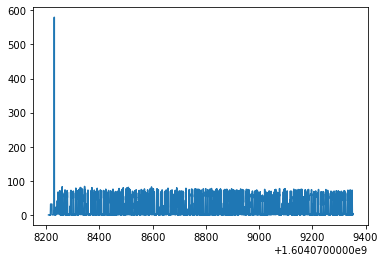

In [45]:
plt.plot(x_pos,y_pos)

In [46]:
import pandas as pd

filename = r'/home/emonroe/Downloads/senor20201030_-Copy1.nwb_TrialsInfoByEpoch.ByTrial.csv'
trial_data = pd.read_csv(filename)
trial_data

,nwb_file_name,epoch,trial_number_by_epoch,leaf,stem,reward,poke_in_ts,reward_on_ts,reward_off_ts,poke_out_ts,...,p_rew_leaf4,p_rew_leaf5,p_rew_leaf6,decay_percent,p_rew_reset_leaf1,p_rew_reset_leaf2,p_rew_reset_leaf3,p_rew_reset_leaf4,p_rew_reset_leaf5,p_rew_reset_leaf6
0,senor20201030_.nwb,2,0,4,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,senor20201030_.nwb,2,1,3,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,senor20201030_.nwb,2,2,2,A,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,senor20201030_.nwb,2,3,1,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,senor20201030_.nwb,2,4,2,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1255,senor20201030_.nwb,14,175,1,A,0,1.604104e+09,NaN,NaN,1.604104e+09,...,50,20,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1256,senor20201030_.nwb,14,176,2,A,1,1.604104e+09,1.604104e+09,1.604104e+09,1.604104e+09,...,50,20,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1257,senor20201030_.nwb,14,177,1,A,1,1.604104e+09,1.604104e+09,1.604104e+09,1.604104e+09,...,50,20,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1258,senor20201030_.nwb,14,178,2,A,1,1.604104e+09,1.604104e+09,1.604104e+09,1.604104e+09,...,50,20,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
trial_data_sesh = trial_data[trial_data.epoch==2]

In [48]:
trial_data_sesh

,nwb_file_name,epoch,trial_number_by_epoch,leaf,stem,reward,poke_in_ts,reward_on_ts,reward_off_ts,poke_out_ts,...,p_rew_leaf4,p_rew_leaf5,p_rew_leaf6,decay_percent,p_rew_reset_leaf1,p_rew_reset_leaf2,p_rew_reset_leaf3,p_rew_reset_leaf4,p_rew_reset_leaf5,p_rew_reset_leaf6
0,senor20201030_.nwb,2,0,4,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,senor20201030_.nwb,2,1,3,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,senor20201030_.nwb,2,2,2,A,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,senor20201030_.nwb,2,3,1,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,senor20201030_.nwb,2,4,2,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,senor20201030_.nwb,2,175,6,C,0,1.604079e+09,NaN,NaN,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176,senor20201030_.nwb,2,176,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
177,senor20201030_.nwb,2,177,6,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178,senor20201030_.nwb,2,178,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
num_secs_to_get = int(trial_data_sesh.iloc[-1].poke_out_ts - trial_data_sesh.iloc[0].poke_in_ts)

In [50]:
#defines trials as the last poke out of one trial to the first poke in time of the next trial. 
trial_times=[]
for ix in range(len(trial_data_sesh)-1):
    trial_start = trial_data_sesh.iloc[ix].poke_out_ts
    trial_end = trial_data_sesh.iloc[ix+1].poke_in_ts
    trial_times.append([trial_start, trial_end])

Text(0, 0.5, 'time(s)')

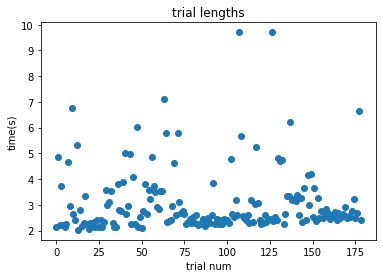

In [51]:
#lengths of trials 

trial_len=[]
for ix in range(len(trial_times)):
    trial_len.append(trial_times[ix][1]-trial_times[ix][0])
plt.scatter(range(len(trial_len)),trial_len)
plt.title('trial lengths')
plt.xlabel('trial num')
plt.ylabel('time(s)')
#ooh label them as stay or go maybe? 

(array([112.,  32.,  13.,  10.,   5.,   2.,   3.,   0.,   0.,   2.]),
 array([2.02499986, 2.79319987, 3.56139989, 4.32959991, 5.09779992,
        5.86599994, 6.63419995, 7.40239997, 8.17059999, 8.9388    ,
        9.70700002]),
 <BarContainer object of 10 artists>)

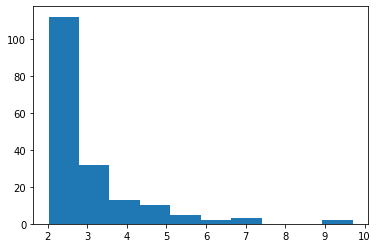

In [52]:
plt.hist(trial_len)

frequency resolution: 7.5


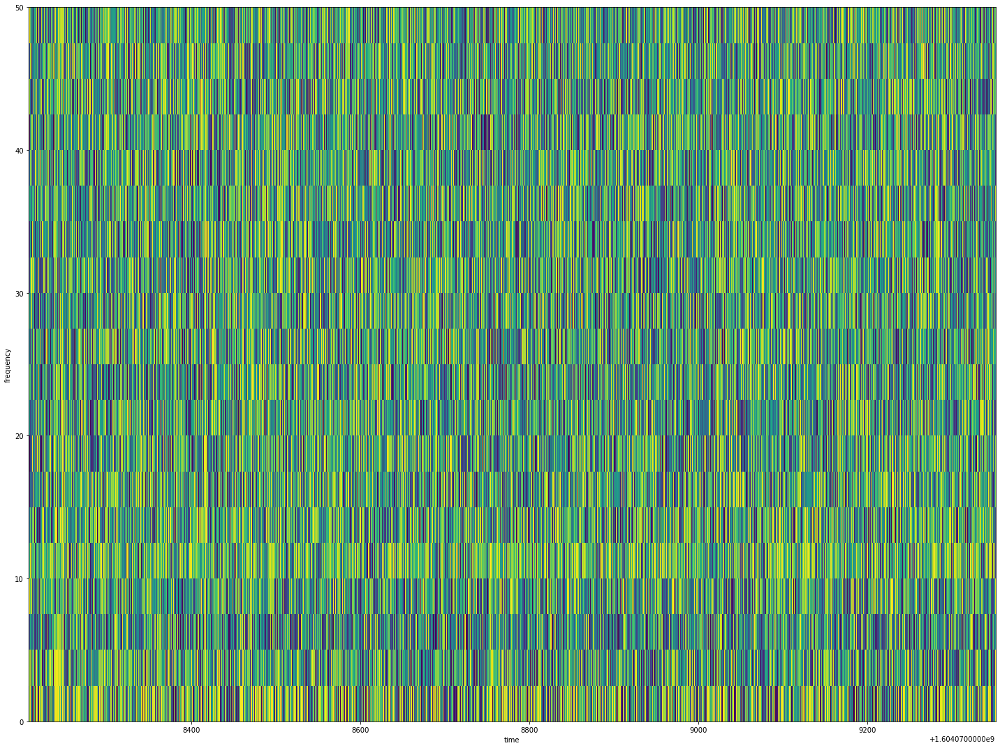

In [183]:
time_halfbandwidth_product = 1.5
sampling_frequency = 1000
n_trials = 100
time_res=.4


electrode_ix1= 0
electrode_ix2= 2


time_data = x_elect_lfp[electrode_ix1]
signal = np.zeros((len(time_data), 2))
signal[:,0] = y_elect_lfp[electrode_ix1]
signal[:,1]=y_elect_lfp[electrode_ix2]



m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               time_window_duration=time_res,
               time_window_step=None,
               start_time=time_data[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
time_grid, freq_grid = np.meshgrid(
    np.append(c.time, c.time[-1]),
    np.append(c.frequencies, m.nyquist_frequency))

plt.figure(figsize=(20,15))
mesh = plt.pcolormesh(time_grid,freq_grid , c.coherence_magnitude()[..., 0, 1].squeeze().T,
                             vmin=0.0, vmax=1.0, cmap='viridis')
plt.ylabel('frequency')
plt.xlabel('time')
# axes[2].set_ylim(0,100)
# axes[2].set_xlim(time_data[0], time_data[-1])
plt.ylim(0,50)

# axes[3].plot(x_pos,y_pos)
# axes[3].set_xlim(time[0], time[-1])



plt.tight_layout()
# cb = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
#                   shrink=.5, aspect=15, pad=0.1, label='Coherence')
# cb.outline.set_linewidth(0)
print('frequency resolution: {}'.format(m.frequency_resolution))

In [184]:
freq_seg = c.frequencies[(c.frequencies >= 7.5) & (c.frequencies <=9)]
coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies >= 7.5) & (c.frequencies <=9)]



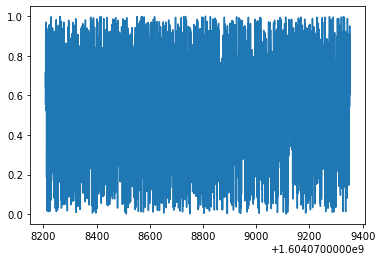

In [185]:
plt.plot(c.time,coh_seg[0])

Text(0.5, 0, 'time')

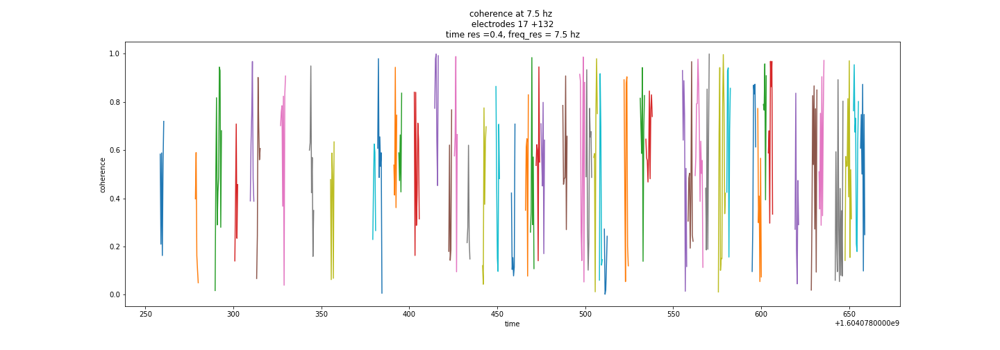

In [186]:
%matplotlib widget
plt.figure(figsize=(20,7))
for times in range(len(trial_times)):
    trial_start=trial_times[times][0]
    trial_end = trial_times[times][1]
    ind_start = c.time>=trial_start 
    ind_end = c.time<=trial_end
    masked_time = c.time[ind_start&ind_end]
    masked_data = coh_seg[0][ind_start&ind_end]
    plt.plot(masked_time,masked_data)
    # plt.vlines(trial_start,0,1,color='g',label='trial_start',alpha=.6)
    # plt.vlines(trial_end,0,1,color='red',label='trial_end',alpha=.6)
    plt.title(f'coherence at {freq_seg[0]} hz \n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n time res ={time_res}, freq_res = {m.frequency_resolution} hz ')

plt.ylabel('coherence')
plt.xlabel('time')
# plt.legend()

# plt.figure(figsize=(15,7))
# for times in range(len(trial_times)):
#     trial_start=trial_times[times][0]
#     trial_end = trial_times[times][1]
#     ind_start = x_pos>=trial_start 
#     ind_end = x_pos<=trial_end
#     masked_time = x_pos[ind_start&ind_end]
#     masked_data = y_pos[ind_start&ind_end]
#     plt.plot(masked_time,masked_data)
#     # plt.vlines(trial_start,0,80,color='g',label='trial_start',alpha=.6)
#     # plt.vlines(trial_end,0,80,color='red',label='trial_end',alpha=.6)
#     # plt.legend()

Text(0.5, 0, 'time since start of trial')

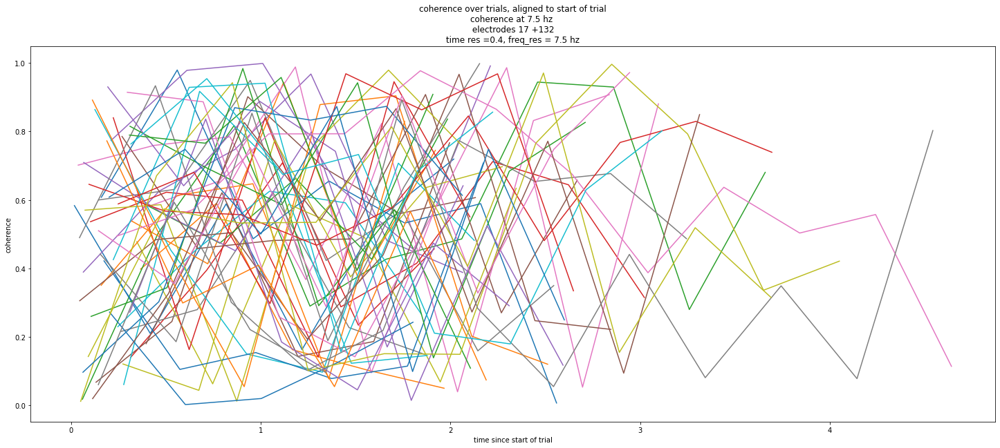

In [187]:
%matplotlib inline
plt.figure(figsize=(25,10))
for times in range(len(trial_times)):
    trial_start=trial_times[times][0]
    trial_end = trial_times[times][1]
    ind_start = c.time>=trial_start 
    ind_end = c.time<=trial_end
    masked_time = c.time[ind_start&ind_end]
    masked_data = coh_seg[0][ind_start&ind_end]
    masked_times_zeroed=[]
#first, mask the data. 
#Then for every time in the masked times data, subtract the first time of that trial so that they all start at zero. 
    for ix in range(len(masked_time)):
        masked_times_zeroed.append(masked_time[ix]- trial_times[times][0])
    
    plt.plot(masked_times_zeroed,masked_data, label = f'trial {times+1}')
    # plt.vlines(trial_start,0,1,color='g',label='trial_start',alpha=.6)
    # plt.vlines(trial_end,0,1,color='red',label='trial_end',alpha=.6)
# plt.title(')
plt.title(f'coherence over trials, aligned to start of trial\ncoherence at {freq_seg[0]} hz \n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n time res ={time_res}, freq_res = {m.frequency_resolution} hz ')


plt.ylabel('coherence')
plt.xlabel('time since start of trial')
# plt.legend()

In [188]:
# to center at the end, find the legnths of each of them and all to list 

trial_len_lst=[]
for ix in range(len(trial_times)):
    trial=trial_times[ix]
    trial_len=trial[1]-trial[0]
    trial_len_lst.append(trial_len)
longest_time = max(trial_len_lst)

trial_len_diff=[]
for ix in range(len(trial_len_lst)):
    trial_len_diff.append( longest_time-trial_len_lst[ix])
trial_len_diff

[2.815999984741211,
 2.746000051498413,
 1.2450001239776611,
 2.745000123977661,
 2.8370001316070557,
 2.7220001220703125,
 2.0270001888275146,
 2.327000141143799,
 2.569000005722046,
 2.94700026512146,
 2.1740002632141113,
 2.7860000133514404,
 2.6760001182556152,
 1.6130001544952393,
 2.7160003185272217,
 2.9030001163482666,
 2.682000160217285,
 2.753999948501587,
 2.63100004196167,
 2.817000150680542,
 2.570000171661377,
 2.81600022315979,
 2.5450000762939453,
 2.818000078201294,
 2.640000104904175,
 1.9830000400543213,
 1.874000072479248,
 1.438000202178955,
 2.695000171661377,
 2.8420002460479736,
 2.8390002250671387,
 2.1650002002716064,
 2.193000078201294,
 1.068000078201294,
 2.326000213623047,
 2.013000249862671,
 0.0,
 2.7180001735687256,
 0.8890001773834229,
 2.7110002040863037,
 2.822000026702881,
 2.439000129699707,
 2.875,
 2.2300000190734863,
 2.3420002460479736,
 1.3840000629425049,
 1.7320001125335693,
 0.10400009155273438,
 1.250000238418579,
 1.4820001125335693,
 2.0

Text(0.5, 0, 'time before end of trial')

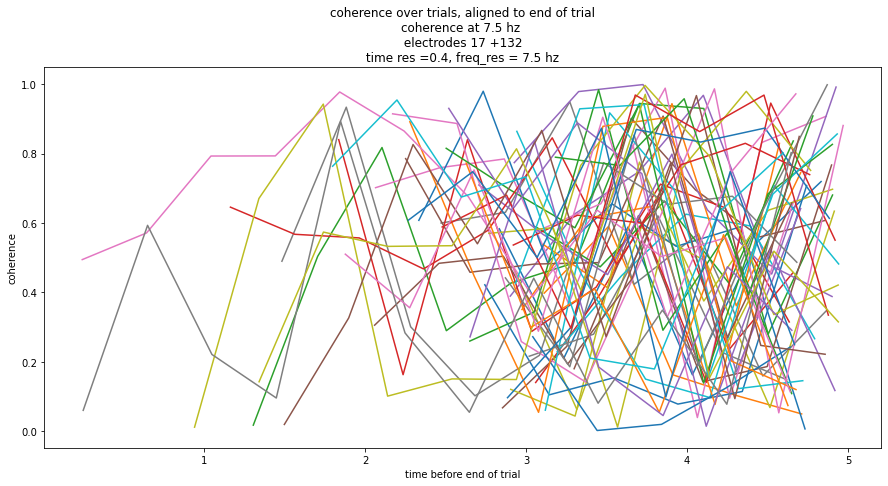

In [189]:
plt.figure(figsize=(15,7))
for times in range(len(trial_times)):
    trial_start=trial_times[times][0]
    trial_end = trial_times[times][1]
    ind_start = c.time>=trial_start 
    ind_end = c.time<=trial_end
    masked_time = c.time[ind_start&ind_end]
    masked_data = coh_seg[0][ind_start&ind_end]
    masked_times_zeroed_end=[]
    masked_times_zeroed_end_shift=[]
    # masked_data_zeroes = []
    for ix in range(len(masked_time)):
        masked_times_zeroed_end.append(masked_time[ix]-trial_times[times][0])
    for indiv_times in range(len(masked_times_zeroed_end)):
        masked_times_zeroed_end_shift.append(masked_times_zeroed_end[indiv_times] +trial_len_diff[times])
    
    plt.plot(masked_times_zeroed_end_shift,masked_data, label = f'trial {times+1}')
    # plt.vlines(trial_start,0,1,color='g',label='trial_start',alpha=.6)
    # plt.vlines(trial_end,0,1,color='red',label='trial_end',alpha=.6)
# plt.title('')
plt.title(f'coherence over trials, aligned to end of trial\ncoherence at {freq_seg[0]} hz \n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n time res ={time_res}, freq_res = {m.frequency_resolution} hz ')


plt.ylabel('coherence')
plt.xlabel('time before end of trial')
# plt.legend()
# labels = np.arange(int(-1*longest_time), 0, step=0.45)
# plt.xticks([0,.5,1,1.5,2,2.5,3,3.5,4],labels)

In [ ]:
#okay so first off, too much data. I could only look at the first quarter of trials. 
#or I could just look at truaks wgeb hes not stem swtiching. More strategic. then only look at first half of those. 


In [73]:
trial_data_sesh

,nwb_file_name,epoch,trial_number_by_epoch,leaf,stem,reward,poke_in_ts,reward_on_ts,reward_off_ts,poke_out_ts,...,p_rew_leaf4,p_rew_leaf5,p_rew_leaf6,decay_percent,p_rew_reset_leaf1,p_rew_reset_leaf2,p_rew_reset_leaf3,p_rew_reset_leaf4,p_rew_reset_leaf5,p_rew_reset_leaf6
0,senor20201030_.nwb,2,0,4,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,senor20201030_.nwb,2,1,3,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,senor20201030_.nwb,2,2,2,A,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,senor20201030_.nwb,2,3,1,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,senor20201030_.nwb,2,4,2,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,senor20201030_.nwb,2,175,6,C,0,1.604079e+09,NaN,NaN,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176,senor20201030_.nwb,2,176,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
177,senor20201030_.nwb,2,177,6,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178,senor20201030_.nwb,2,178,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [190]:
trial_data_sesh['stem_switch'] = trial_data_sesh['stem'].ne(trial_data_sesh['stem'].shift())

for ix in range(len(trial_data_sesh)):
    if trial_data_sesh.loc[ix,'trial_number_by_epoch']==0:
        trial_data_sesh.loc[ix,'stem_switch']= True
trial_data_sesh['stem_switch']=trial_data_sesh['stem_switch'].shift(-1)        

In [191]:
trial_data_sesh['stem_switch']=trial_data_sesh['stem_switch'].shift(-1)

In [192]:
trial_data_sesh

,nwb_file_name,epoch,trial_number_by_epoch,leaf,stem,reward,poke_in_ts,reward_on_ts,reward_off_ts,poke_out_ts,...,p_rew_leaf5,p_rew_leaf6,decay_percent,p_rew_reset_leaf1,p_rew_reset_leaf2,p_rew_reset_leaf3,p_rew_reset_leaf4,p_rew_reset_leaf5,p_rew_reset_leaf6,stem_switch
0,senor20201030_.nwb,2,0,4,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
1,senor20201030_.nwb,2,1,3,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True
2,senor20201030_.nwb,2,2,2,A,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
3,senor20201030_.nwb,2,3,1,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
4,senor20201030_.nwb,2,4,2,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,senor20201030_.nwb,2,175,6,C,0,1.604079e+09,NaN,NaN,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
176,senor20201030_.nwb,2,176,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
177,senor20201030_.nwb,2,177,6,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
178,senor20201030_.nwb,2,178,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False


In [193]:
trial_times=[]
for ix in range(len(trial_data_sesh)-1):
    if trial_data_sesh.iloc[ix].stem_switch == False:
        # if trial_data_sesh.iloc[ix].trial_number_by_epoch >=60:
        if trial_data_sesh.iloc[ix].trial_number_by_epoch <60:
            trial_start = trial_data_sesh.iloc[ix].poke_out_ts
            trial_end = trial_data_sesh.iloc[ix+1].poke_in_ts
            trial_times.append([trial_start, trial_end])

In [141]:
len(trial_times)

51

In [81]:
sum(trial_data_sesh.stem_switch)

nan

In [84]:
trial_data_sesh.stem_switch.sum()

15

Text(0.5, 0, 'time since start of trial')

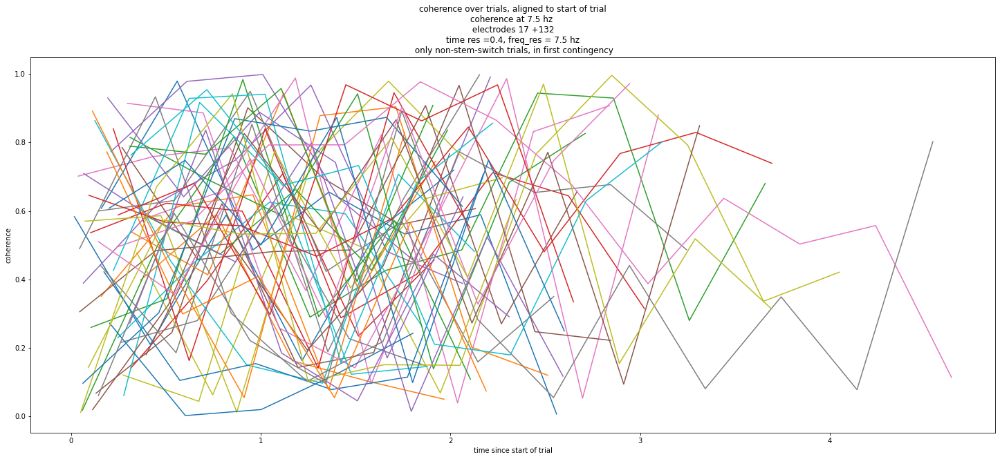

In [194]:
%matplotlib inline
plt.figure(figsize=(25,10))
saved_times = []
saved_data = []
for times in range(len(trial_times)):
    trial_start=trial_times[times][0]
    trial_end = trial_times[times][1]
    ind_start = c.time>=trial_start 
    ind_end = c.time<=trial_end
    masked_time = c.time[ind_start&ind_end]
    masked_data = coh_seg[0][ind_start&ind_end]
    masked_times_zeroed=[]
#first, mask the data. 
#Then for every time in the masked times data, subtract the first time of that trial so that they all start at zero. 
    for ix in range(len(masked_time)):
        masked_times_zeroed.append(masked_time[ix]- trial_times[times][0])
    saved_times.append(masked_times_zeroed)
    saved_data.append(masked_data)
    
    plt.plot(masked_times_zeroed,masked_data, label = f'trial {times+1}')
    # plt.vlines(trial_start,0,1,color='g',label='trial_start',alpha=.6)
    # plt.vlines(trial_end,0,1,color='red',label='trial_end',alpha=.6)
# plt.title(')
plt.title(f'coherence over trials, aligned to start of trial\ncoherence at {freq_seg[0]} hz \n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n time res ={time_res}, freq_res = {m.frequency_resolution} hz \n only non-stem-switch trials, in first contingency')


plt.ylabel('coherence')
plt.xlabel('time since start of trial')
# plt.legend()

In [90]:
masked_times_zeroed

[]

In [96]:
len(saved_data)

164

In [195]:
saved_data_lists=[]
for ix in range(len(saved_data)): 
    saved_data_lists.append(saved_data[ix].tolist())
    

In [196]:
saved_data_lists=[]
for ix in range(len(saved_data)): 
    saved_data_lists.append(saved_data[ix].tolist())
df = pd.DataFrame(saved_data_lists)

In [177]:
df3 = df[0:int(len(df)/3)]
df3

,0,1,2,3,4,5,6,7
0,0.658389,0.416852,0.412093,NaN,NaN,NaN,NaN,NaN
1,0.000448,0.388609,0.508425,NaN,NaN,NaN,NaN,NaN
2,0.770554,0.517364,0.839632,0.534403,0.843579,0.815546,NaN,NaN
3,0.147876,0.955153,0.797371,0.136764,NaN,NaN,NaN,NaN
4,0.796802,0.719276,0.700193,0.521775,NaN,NaN,NaN,NaN
5,0.602123,0.811396,0.071101,0.717589,NaN,NaN,NaN,NaN
6,0.621386,0.341234,0.576474,0.564822,0.090867,NaN,NaN,NaN
7,0.944852,0.364052,0.774838,0.323448,NaN,NaN,NaN,NaN
8,0.192805,0.515213,0.708662,0.696371,NaN,NaN,NaN,NaN
9,0.540727,0.577737,0.320906,NaN,NaN,NaN,NaN,NaN


In [197]:
df2 = df.mean(axis=0)
df2
plt.plot(df2)
plt.title('average of first contingency coherences on stay trials- now pfc CC')
# plt.title('average of all stay trial coherence values\n note that most trials are only 2 seconds long, meaning 4 data points')

plt.xlabel('coherence sample number- time res = .4s')
plt.ylabel('coherence')

0     0.467757
1     0.533001
2     0.596614
3     0.404000
4     0.545374
5     0.552403
6     0.505866
7     0.610322
8     0.559178
9     0.487013
10    0.351864
11    0.458083
dtype: float64

Text(0, 0.5, 'coherence')

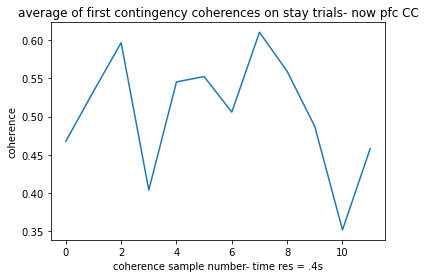

In [199]:
plt.plot(df2)
plt.title('average of first contingency coherences on stay trials- now pfc CC')
# plt.title('average of all stay trial coherence values\n note that most trials are only 2 seconds long, meaning 4 data points')

plt.xlabel('coherence sample number- time res = .4s')
plt.ylabel('coherence')

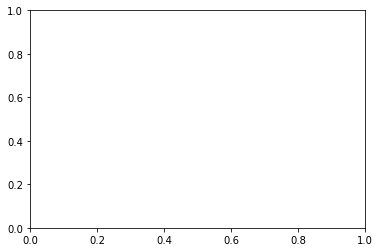

In [ ]:
plt.plot(saved_data_lists)

In [122]:
import numpy as np
# a = np.array(saved_data_lists)
res = np.average(saved_data_lists, axis=0)
print(res)

[4.42216556e-03 2.13215548e-03 2.81142256e-03 1.09999541e-05
 2.69267459e-03 3.59879038e-03 3.67499095e-03 2.86943095e-03
 4.79189243e-03 4.16119904e-03 5.28309861e-03 4.47908554e-03
 4.39335016e-04 5.84146548e-03 4.88635148e-03 1.39461995e-03
 5.16208567e-03 4.28572350e-03 4.90032406e-03 3.70494204e-03
 3.40391892e-03 4.94368931e-03 1.99157262e-04 5.76014490e-03
 5.44630644e-03 2.67457275e-03 3.49193113e-03 4.13025313e-03
 6.67521344e-04 5.59556651e-03 1.26915935e-03 4.49058484e-03
 1.92770278e-03 9.49829422e-04 2.79494626e-03 4.35519516e-03
 3.99195202e-03 3.35630747e-03 4.31808678e-03 1.99052552e-03
 4.23483477e-03 8.73154044e-04 4.23133810e-04 3.38888201e-03
 5.10071458e-03 3.88562013e-03 1.42017878e-03 4.68327992e-03
 3.88254931e-03 5.71828502e-04 5.32400470e-03 3.17788095e-03
 5.95376138e-03 6.03363657e-03 3.05087262e-03 5.97408059e-03
 4.50301709e-03 5.52735666e-03 6.02238948e-03 3.70348509e-03
 5.71389390e-03 2.19428832e-03 4.09156334e-03 5.47016858e-03
 6.02130184e-03 4.922114

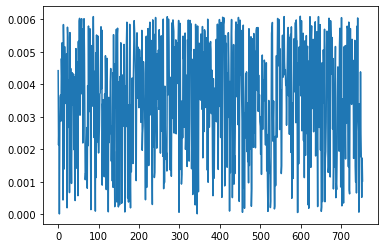

In [121]:
len(a)

164